In [1]:
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

from tensorflow.keras import Model
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, GlobalMaxPool2D, GlobalAveragePooling2D
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.utils import plot_model

In [2]:
import tensorflow as tf

print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))
if tf.config.list_physical_devices('GPU'):
    print("GPU is available")
else:
    print("GPU is not available, please check your installation")


Num GPUs Available:  1
GPU is available


In [3]:
# dataset을 training set과 validation set으로 나누기 8:2비율
batch_size = 32
img_height = 224
img_width = 224

image_directory = './Digital images of defective and good condition tyres'

train_data = tf.keras.utils.image_dataset_from_directory(
    image_directory,  # 이미지가 저장된 디렉토리 경로
    validation_split=0.2,  # 데이터셋을 훈련과 검증으로 나누는 비율 (여기서는 20%를 검증 데이터로 사용)
    seed=123,  # 데이터셋 분할의 재현성을 위해 사용되는 시드 값
    subset='training',  # 훈련 데이터셋을 생성하기 위해 'training' 서브셋을 지정
    image_size=(img_height, img_width),  # 이미지 크기를 (img_height, img_width)로 조정
    batch_size=batch_size  # 배치 크기를 지정
)

class_names=train_data.class_names
print(class_names)

# validation data 만들기
val_data = tf.keras.utils.image_dataset_from_directory(
    image_directory,  # 이미지가 저장된 디렉토리 경로
    validation_split=0.2,  # 데이터셋을 훈련과 검증으로 나누는 비율
    seed=123,  # 데이터셋 분할의 재현성을 위해 사용되는 시드 값
    subset='validation',  # 검증 데이터셋을 생성하기 위해 'validation' 서브셋을 지정
    image_size=(img_height, img_width),  # 이미지 크기를 (img_height, img_width)로 조정
    batch_size=batch_size  # 배치 크기를 지정
)

Found 1856 files belonging to 2 classes.
Using 1485 files for training.
['defective', 'good']
Found 1856 files belonging to 2 classes.
Using 371 files for validation.


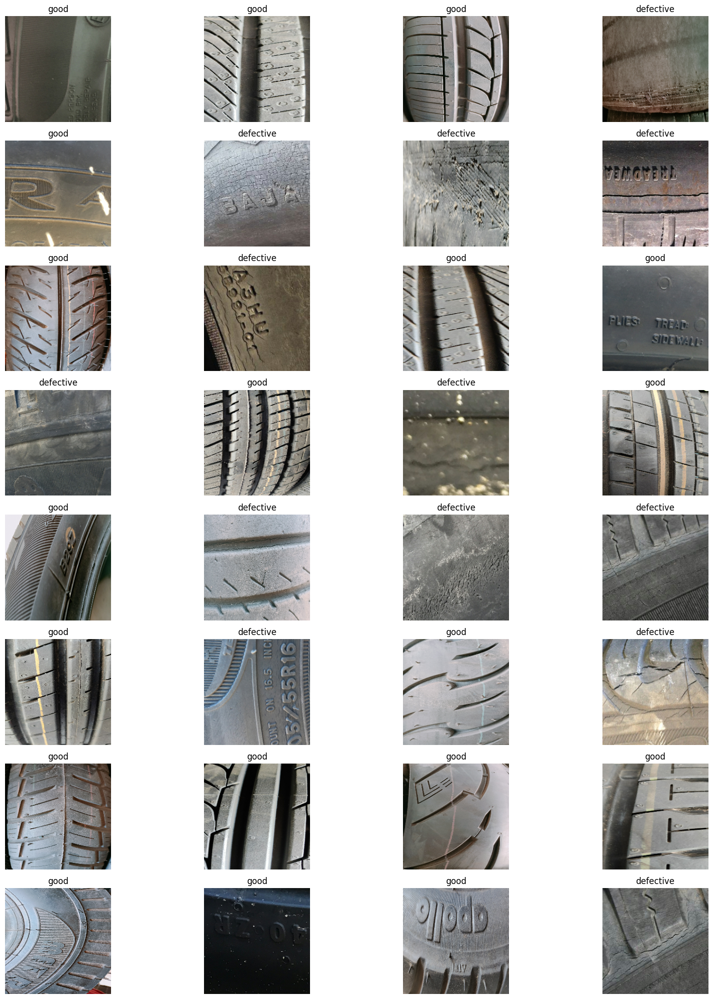

In [4]:
# Plot the images
plt.figure(figsize=(20,20), tight_layout=True, facecolor="white")
for image, label in train_data.take(1):
    for i in range(32):
        ax=plt.subplot(8, 4, i+1)
        plt.imshow(image[i].numpy().astype("uint8"))
        plt.title(class_names[label[i]])
        plt.axis("off")

# 전이 학습을 통한 모델 훈련

In [5]:
import tensorflow as tf

# LeNet-5 모델 정의
def LeNet5(input_shape=(224, 224, 3), classes=1):
    model = tf.keras.models.Sequential()
    model.add(tf.keras.layers.Conv2D(filters=6, kernel_size=(5, 5), strides=(1, 1), activation='tanh', input_shape=input_shape, padding='same'))
    model.add(tf.keras.layers.AveragePooling2D(pool_size=(2, 2), strides=(2, 2), padding='valid'))
    model.add(tf.keras.layers.Conv2D(filters=16, kernel_size=(5, 5), strides=(1, 1), activation='tanh', padding='valid'))
    model.add(tf.keras.layers.AveragePooling2D(pool_size=(2, 2), strides=(2, 2), padding='valid'))
    model.add(tf.keras.layers.Conv2D(filters=120, kernel_size=(5, 5), strides=(1, 1), activation='tanh', padding='valid'))
    model.add(tf.keras.layers.Flatten())
    model.add(tf.keras.layers.Dense(84, activation='tanh'))
    model.add(tf.keras.layers.Dense(classes, activation='sigmoid'))
    return model

# LeNet-5 모델 생성
input_shape = (224, 224, 3)
model = LeNet5(input_shape=input_shape, classes=1)

# 모델 컴파일
model.compile(loss=tf.keras.losses.BinaryCrossentropy(),
              optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
              metrics=["accuracy"])

# 콜백 설정
learning_rate_reduction = tf.keras.callbacks.ReduceLROnPlateau(
    monitor="val_loss",
    patience=2,
    factor=0.5,
    min_lr=0.00001,
    verbose=1
)

Early_Stopping = tf.keras.callbacks.EarlyStopping(
    monitor="val_loss",
    patience=5,
    restore_best_weights=True
)




In [6]:
# 모델 훈련
history = model.fit(train_data, epochs=100, validation_data=val_data, callbacks=[Early_Stopping, learning_rate_reduction], verbose=1)

Epoch 1/100
47/47 [==============================] - 12s 192ms/step - loss: 3.6100 - accuracy: 0.5502 - val_loss: 2.7031 - val_accuracy: 0.5660 - lr: 0.0010
Epoch 2/100
47/47 [==============================] - 10s 176ms/step - loss: 1.9602 - accuracy: 0.5508 - val_loss: 1.1183 - val_accuracy: 0.5660 - lr: 0.0010
Epoch 3/100
47/47 [==============================] - 10s 179ms/step - loss: 0.8054 - accuracy: 0.5508 - val_loss: 0.6850 - val_accuracy: 0.5660 - lr: 0.0010
Epoch 4/100
47/47 [==============================] - 10s 184ms/step - loss: 0.6902 - accuracy: 0.5508 - val_loss: 0.6847 - val_accuracy: 0.5660 - lr: 0.0010
Epoch 5/100
47/47 [==============================] - 9s 176ms/step - loss: 0.6889 - accuracy: 0.5508 - val_loss: 0.6845 - val_accuracy: 0.5660 - lr: 0.0010
Epoch 6/100
47/47 [==============================] - 9s 175ms/step - loss: 0.6890 - accuracy: 0.5508 - val_loss: 0.6848 - val_accuracy: 0.5660 - lr: 0.0010
Epoch 7/100
47/47 [==============================] - ETA: 0s

In [7]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 224, 224, 6)       456       
                                                                 
 average_pooling2d (AverageP  (None, 112, 112, 6)      0         
 ooling2D)                                                       
                                                                 
 conv2d_1 (Conv2D)           (None, 108, 108, 16)      2416      
                                                                 
 average_pooling2d_1 (Averag  (None, 54, 54, 16)       0         
 ePooling2D)                                                     
                                                                 
 conv2d_2 (Conv2D)           (None, 50, 50, 120)       48120     
                                                                 
 flatten (Flatten)           (None, 300000)            0

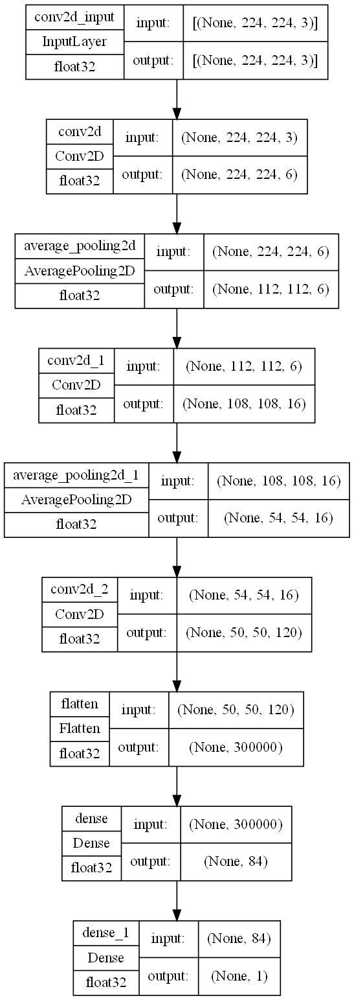

In [8]:
tf.keras.utils.plot_model(
    model,                 # 시각화할 Keras 모델
    show_shapes=True,      # 각 레이어의 출력 형태를 시각화에 포함할지 여부(True: 각 레이어별 출력 텐서 표시)
    show_layer_names=True, # 각 레이어의 이름을 시각화에 포함할지 여부
    show_dtype=True,       # 각 레이어의 데이터 타입을 시각화에 포함할지 여부
    dpi=120                # 시각화 이미지의 해상도 설정 (점 per 인치) (높은 dpi 높은 해상도)
)

In [9]:
import pandas as pd

# history.history 속성을 사용하여 DataFrame 생성
history_dict = history.history
dataframe = pd.DataFrame(history_dict)

# DataFrame 출력
print(dataframe)


       loss  accuracy  val_loss  val_accuracy       lr
0  3.609992  0.550168  2.703074      0.566038  0.00100
1  1.960202  0.550842  1.118280      0.566038  0.00100
2  0.805387  0.550842  0.685050      0.566038  0.00100
3  0.690166  0.550842  0.684726      0.566038  0.00100
4  0.688882  0.550842  0.684482      0.566038  0.00100
5  0.689012  0.550842  0.684797      0.566038  0.00100
6  0.689219  0.550842  0.685205      0.566038  0.00100
7  0.688825  0.550842  0.684656      0.566038  0.00050
8  0.688607  0.550842  0.684713      0.566038  0.00050
9  0.688162  0.550842  0.684656      0.566038  0.00025


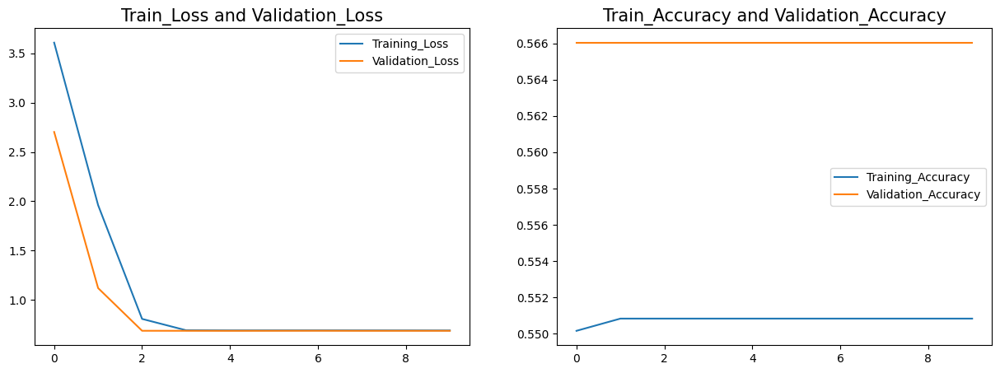

In [10]:
plt.figure(figsize=(15,5))

plt.subplot(1,2,1)
plt.plot(dataframe["loss"], label="Training_Loss")
plt.plot(dataframe["val_loss"], label="Validation_Loss")
plt.title('Train_Loss and Validation_Loss',fontsize=15)
plt.legend()

plt.subplot(1,2,2)
plt.plot(dataframe["accuracy"], label="Training_Accuracy")
plt.plot(dataframe["val_accuracy"], label="Validation_Accuracy")
plt.title('Train_Accuracy and Validation_Accuracy',fontsize=15)
plt.legend()
plt.show()

In [11]:
loss, accuracy=model.evaluate(val_data)
print(f"Accuracy:{accuracy}")
print(f"Loss:{loss}")

12/12 [==============================] - 2s 62ms/step - loss: 0.6845 - accuracy: 0.5660
Accuracy:0.5660377144813538
Loss:0.6844820976257324


In [12]:
x_val=[]
y_val=[]


for image, label in val_data:
    x_val.extend(image.numpy())
    y_val.extend(label.numpy())    

In [13]:
# Lets make the Predictions
predictions=model.predict(np.array(x_val))

y_pred=[int(np.round(prediction)) for prediction in predictions]

12/12 [==============================] - 1s 34ms/step


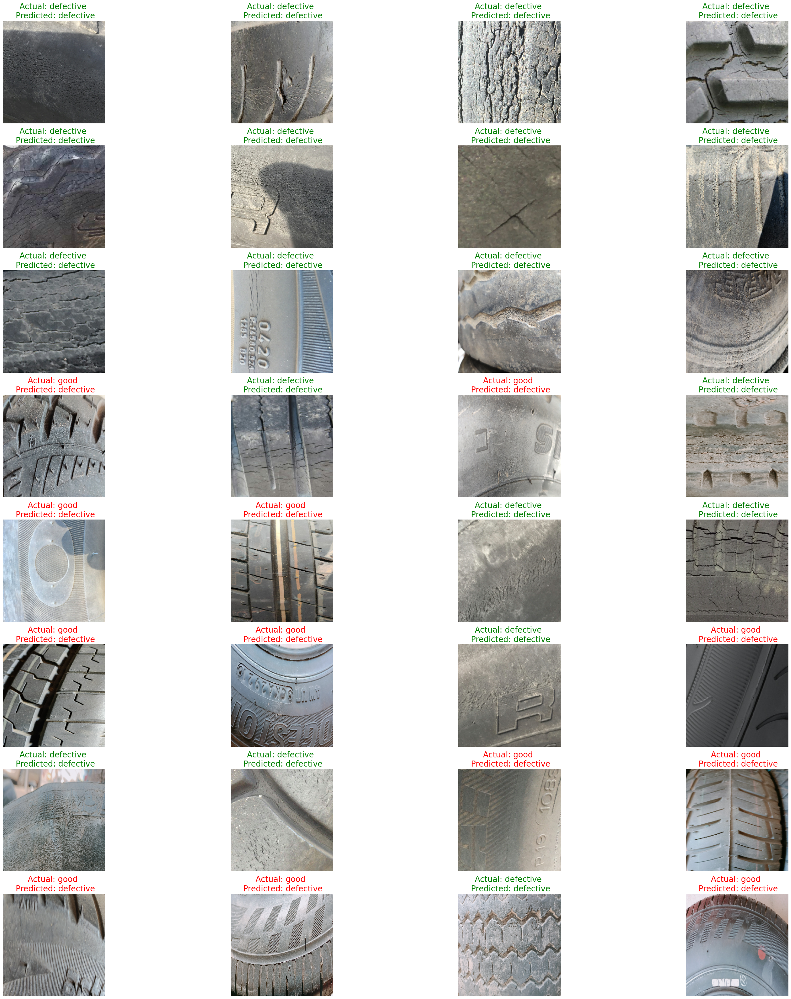

In [14]:
plt.figure(figsize=(35, 35),tight_layout=True, facecolor="white")


for i in range(32):
    ax = plt.subplot(8, 4, i + 1)
    plt.imshow(x_val[i].astype("uint8"))
    actual_label = class_names[y_val[i]]
    predicted_label = class_names[y_pred[i]]
    
    # Check if the actual and predicted labels are the same
    if actual_label == predicted_label:
        label_color ='green'
    else:
        label_color = 'red'
    
     
    plt.title(f'Actual: {actual_label} \n Predicted: {predicted_label}', color=label_color,fontsize=20)
    plt.axis("off")

plt.show()

F1-Score:[0.3614457831325301]
Precision:[0.5]
Recall:[0.2830188679245283]
Classification_Report
-----------------------
              precision    recall  f1-score   support

           0       0.57      1.00      0.72       210
           1       0.00      0.00      0.00       161

    accuracy                           0.57       371
   macro avg       0.28      0.50      0.36       371
weighted avg       0.32      0.57      0.41       371

Confusion_Matrix
----------------------


C:\Users\kimdo\anaconda3\envs\kdh\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\kimdo\anaconda3\envs\kdh\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\kimdo\anaconda3\envs\kdh\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\kimdo\anaconda3\envs\kdh\lib\site-packag

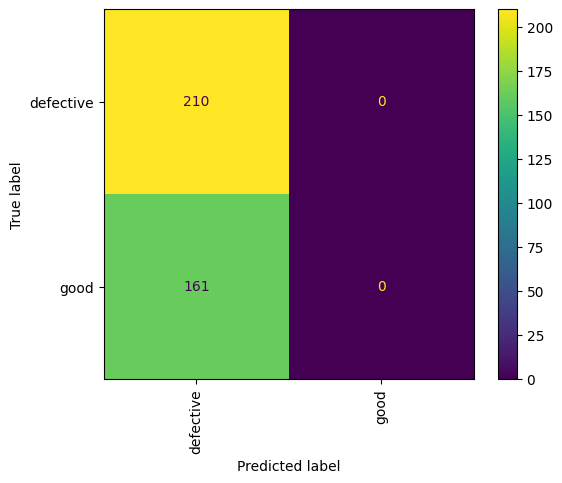

In [15]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import f1_score, precision_score, recall_score, classification_report, ConfusionMatrixDisplay

f1_scores=[]
precision_scores=[]
recall_scores=[]

f1_scores.append(f1_score(y_pred, y_val, average="macro"))
precision_scores.append(precision_score(y_pred, y_val, average="macro"))
recall_scores.append(recall_score(y_pred, y_val, average="macro"))


# Print the Results
print(f"F1-Score:{f1_scores}")
print(f"Precision:{precision_scores}")
print(f"Recall:{recall_scores}")



print("Classification_Report")
print("-----------------------")
print(classification_report(y_val,y_pred))
print("Confusion_Matrix")
print("----------------------")
ConfusionMatrixDisplay.from_predictions(y_val, y_pred, display_labels=class_names, xticks_rotation="vertical")
plt.show()


In [16]:
model_name=["LeNet5"]
result_df= pd.DataFrame({"F1_Score":f1_scores, "Precision_Score":precision_scores, "Recall_Score":recall_scores}, index=model_name)
result_df= result_df.T.sort_values(by="LeNet5", ascending=False)
result_df

,LeNet5
Precision_Score,0.500000
F1_Score,0.361446
Recall_Score,0.283019


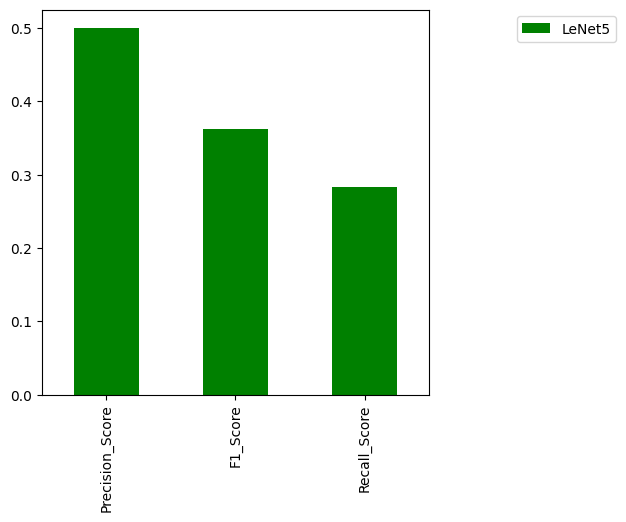

In [17]:
result_df.plot(kind="bar",figsize=(5,5), color="Green").legend(bbox_to_anchor=(1.5,1))